# Kaggle August Playground Series

Task is to predict whether a product will fail (1) or succeed (0) in cleaning up a spill.

Components of this workbook:

* EDA
    * sweetviz
        * train
        * test
    * AUC comparisons
    * 17 vs variables by product_code
    * Missingness
* Modeling
    * Nested CV
    * Iterative imputation using:
        * Grouped linear regression
        * lightgbm
        * mixed effects regression
* 

## EDA

Using the `sweetviz` library: <https://github.com/fbdesignpro/sweetviz>

After downloading and unzipping `train.csv` and `test.csv` to local folder

### General Associations

Takeaways from this section:

* `loading` is only feature with clear relationship to target
* Strange correlation between measurements 4-9 and measurement 17. This will be important later

In [1]:
import pandas as pd
import numpy as np
from collections import defaultdict
from itertools import combinations
from lightgbm import LGBMRegressor
from category_encoders import WOEEncoder

import matplotlib.pyplot as plt
import sweetviz as sv
import seaborn as sns

from sklearn import clone
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge, LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer


c:\Users\robert.robison\.virtualenvs\ar_forecasting\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
plt.style.use("ggplot")

train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data/test.csv")

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



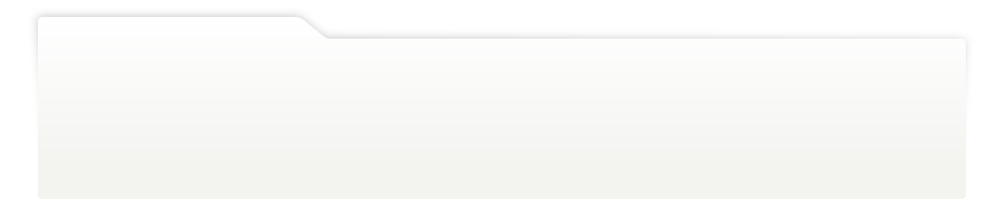
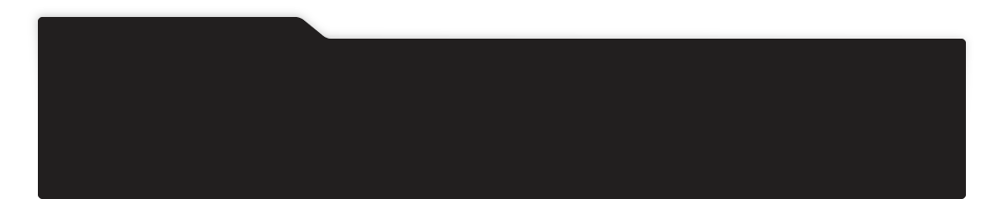
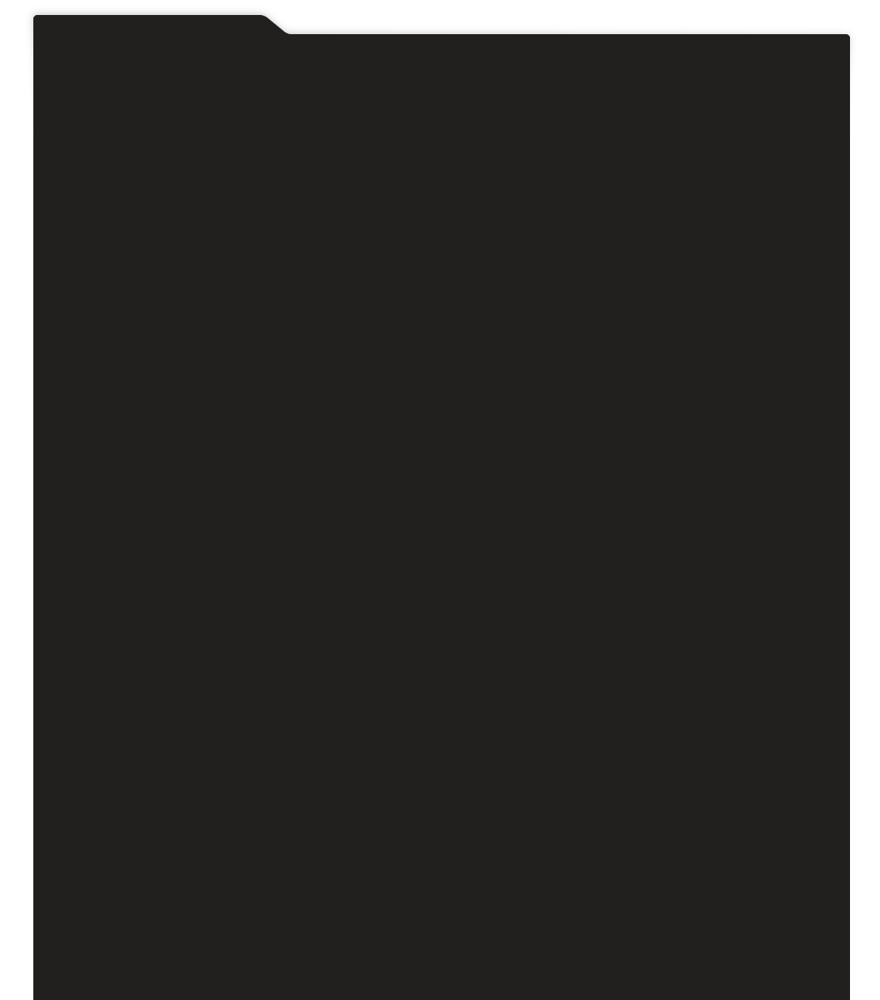
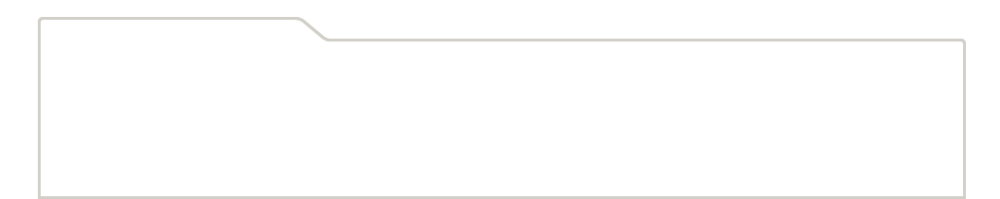
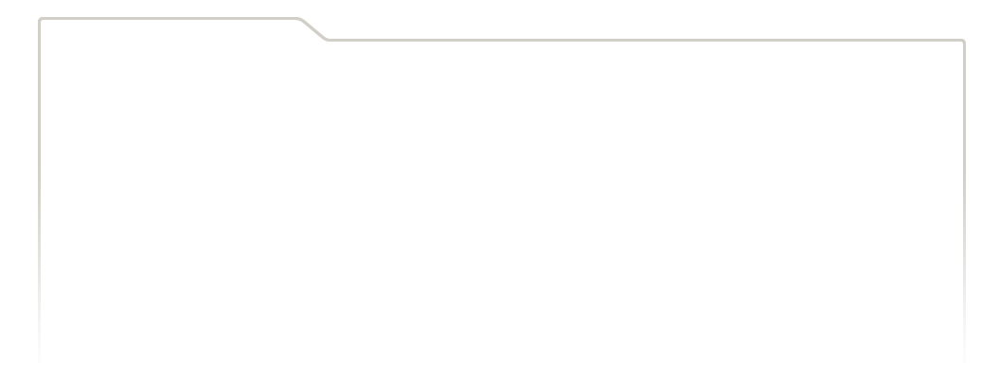
...
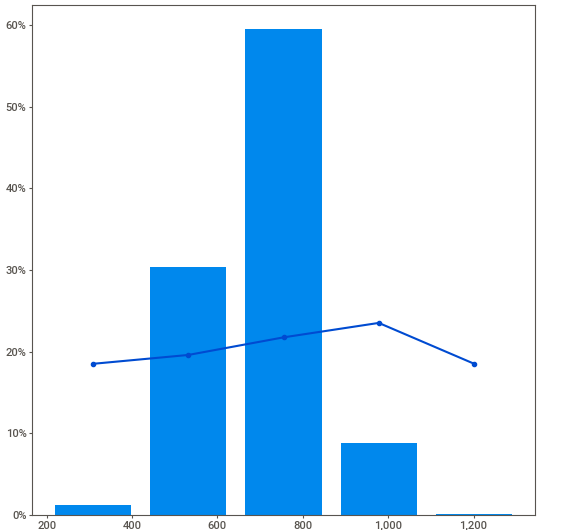
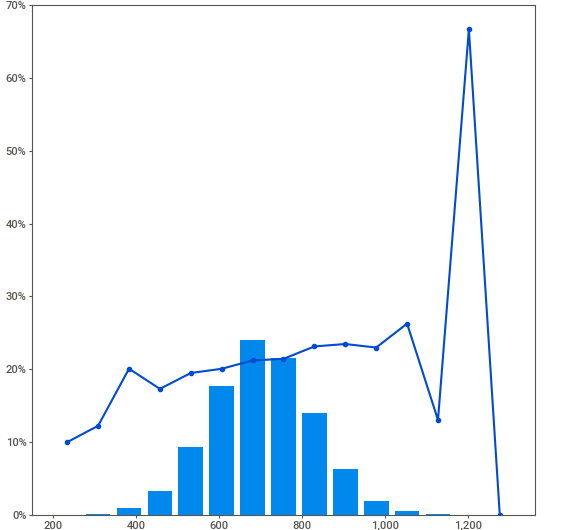
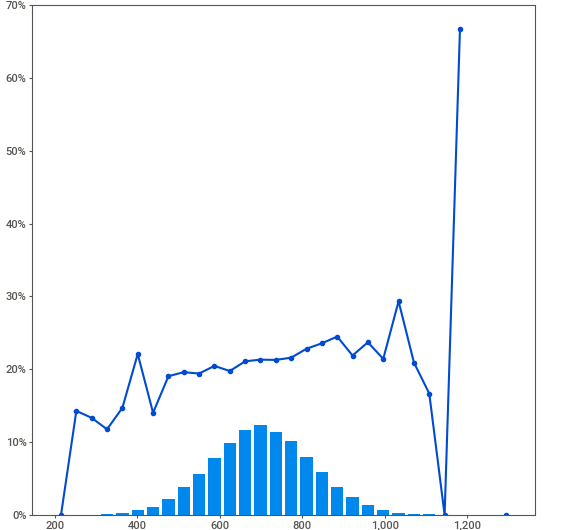
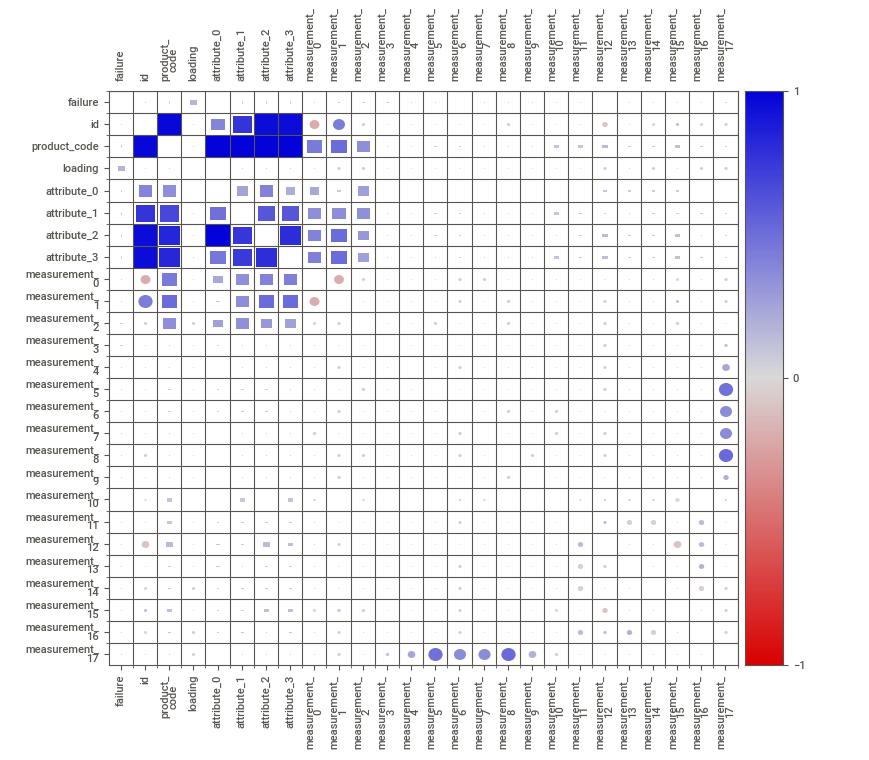
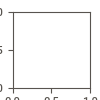

In [3]:

train_report = sv.analyze(train, target_feat="failure")
train_report.show_notebook()

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:03 -> (00:00 left)



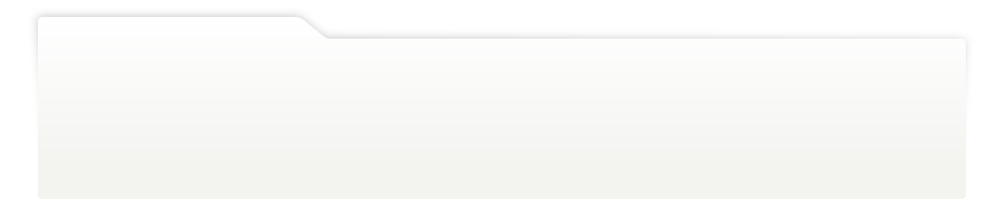
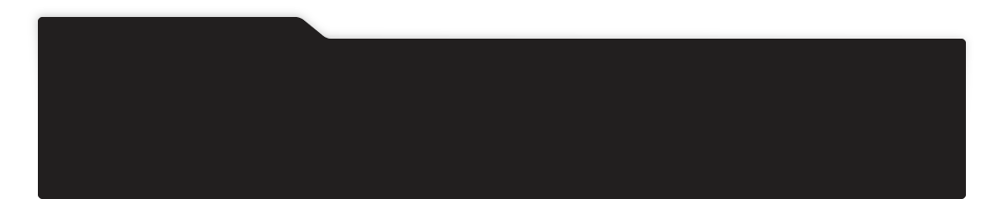
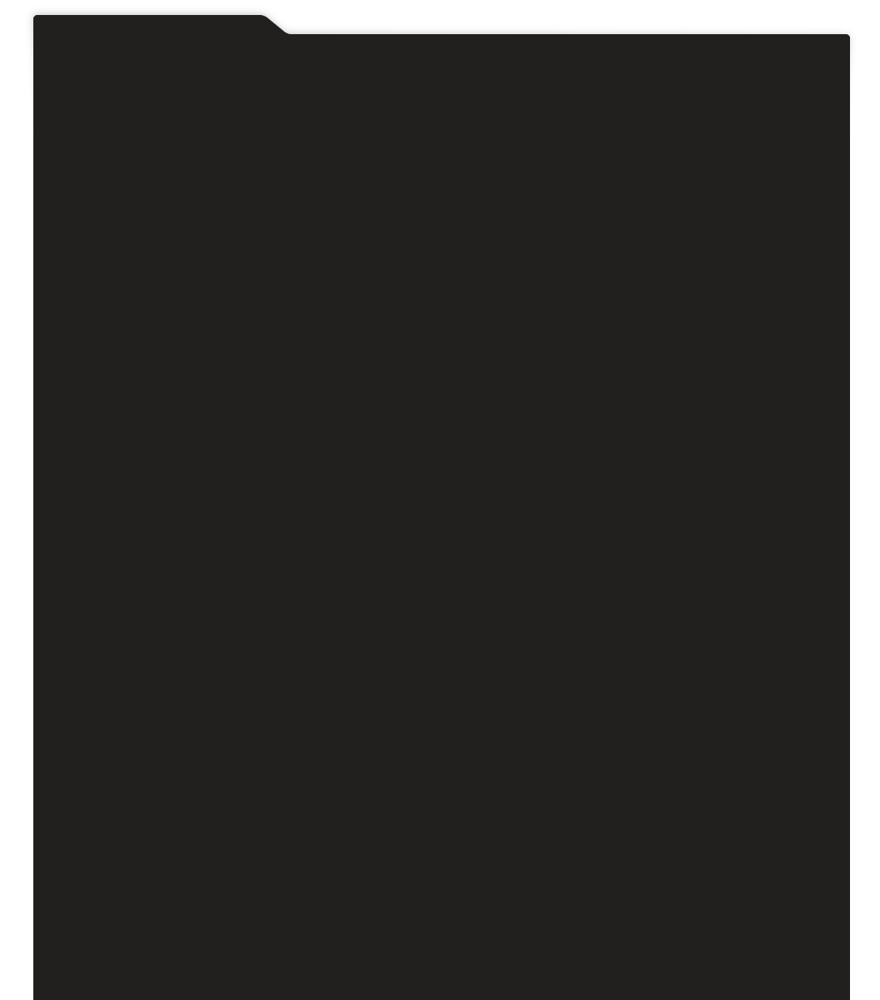
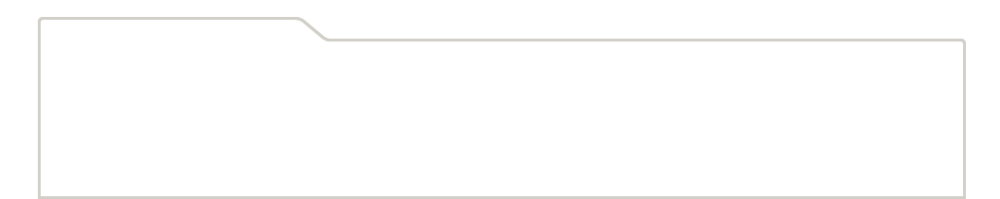
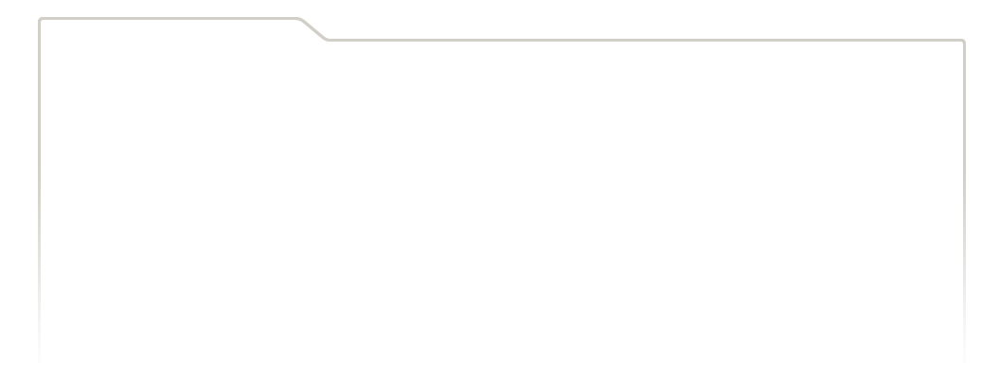
...
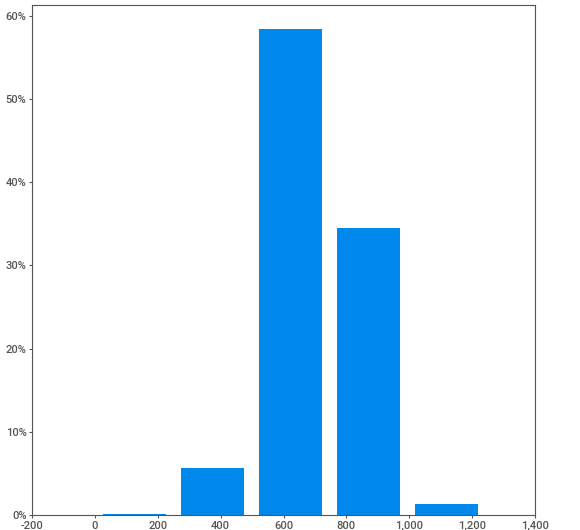
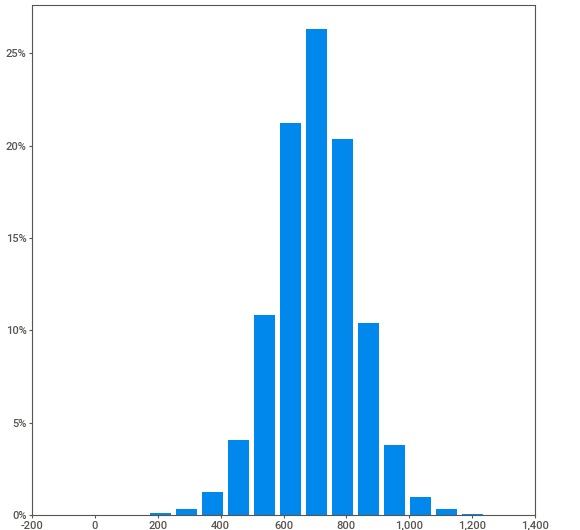
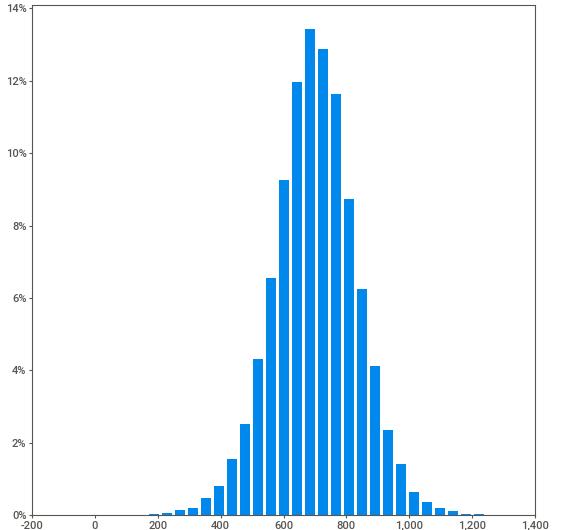
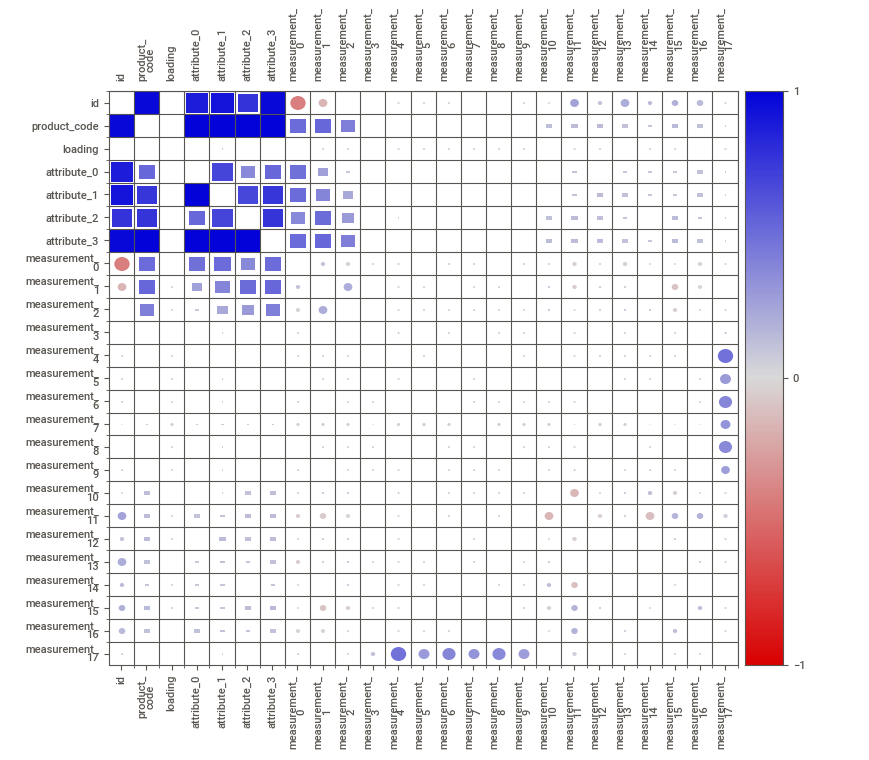
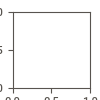

In [4]:
test_report = sv.analyze(test)
test_report.show_notebook()

As mentioned above, only `loading` has a clear correlation with `failure`, and it is not correlated with anything else. The `product_code`, attributes, and measurements seem to have a varying degree of correlations from none to strong to somewhere in between.

The strangest thing though is the strong correlations between measurements 4-9 and 17, especially since measurements 4-9 are not correlated with themselves. This is suspicious, and not something I'd expect to see on a real dataset. It indicates that **measurement 17 is created using a linear combination of measurements 4-9**.

What is more interesting, is the strength of the correlations changes between train and test. For example, the correlation coefficient between measurement 4 and measurement 17 is 0.19 on the train data and 0.45 on the test data. A variation this large seems unlikely due to chance alone. But since the `product_codes` in train vs test are mutually exclusive, looking at correlations broken down by `product_code` might be useful.

### Measurements 4-9 vs 17 broken down by `product_code`

Simple groupby correlation calculations


In [5]:
g = train.groupby("product_code").apply(lambda df: df.corr().loc["measurement_17", [f"measurement_{i}" for i in range(4, 10)]])
g.style.background_gradient(axis=None, vmin=-1, vmax=1).format("{:.2f}")

measurement_17,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,measurement_9
product_code,,,,,,
A,0.14,0.56,0.28,0.24,0.74,0.02
B,0.40,0.32,0.01,0.80,0.02,0.25
C,0.01,0.43,0.05,0.34,0.76,0.32
D,0.01,0.45,0.69,0.35,0.40,-0.00
E,0.43,0.49,0.55,0.01,0.53,0.14


In [6]:
g = test.groupby("product_code").apply(lambda df: df.corr().loc["measurement_17", [f"measurement_{i}" for i in range(4, 10)]])
g.style.background_gradient(cmap="coolwarm", axis=None).format("{:.2f}")

measurement_17,measurement_4,measurement_5,measurement_6,measurement_7,measurement_8,measurement_9
product_code,,,,,,
F,0.56,0.33,0.57,0.49,0.00,-0.02
G,0.50,0.15,0.61,-0.01,0.48,0.37
H,0.50,0.52,0.03,0.31,0.32,0.52
I,0.20,-0.03,-0.02,0.34,0.79,0.21


The correlations vary significantly from one `product_code` to the other, indicating there might be separate linear models for each `product_code`. If we need to predict `measurement_17` for any reason (such as imputation), one solution could be a linear mixed effects model.

### Feature Importance


#### Process Number 1 - Comparison to Shadow Features

With data where most predictors look pretty unimportant, it can be helpful to create shuffled copies of every feature to see which (if any) look like they could be helpful.

Here's the process:

1. Subset temporarily to numeric columns
2. Create a shuffled copy of every feature, adding to the dataframe (call them shadow features, like Boruta)
3. Measure feature importance using:
      1. AUC with target
      2. correlation with target
4. Identify features that look significantly better than shadow features

In [7]:
def correlation(y_true, y_pred):
    # helper function
    return pd.concat([y_true, y_pred], axis=1).corr().iloc[0, 1]

In [8]:
num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
rng = np.random.default_rng(5)
num_train_shadows = train[num_cols + ["failure"]].copy()
for col in num_cols:
    arr = num_train_shadows[col].to_numpy()
    num_train_shadows[f"shadow_{col}"] = rng.permutation(arr)

met_funcs = [correlation, roc_auc_score]

row_list = []
groups = rng.choice(5, size=num_train_shadows.shape[0])
for col in num_train_shadows.columns:
    if col in ["id", "failure", "product_code"]:
        continue
    for group in np.unique(groups):
        # mask = num_train_shadows[col].notna() & (groups == group)
        mask = num_train_shadows[col].notna()
        tmp = num_train_shadows[mask].sample(int(0.8 * num_train_shadows.shape[0]), replace=True)
        for met in met_funcs:
            # val = met(num_train_shadows.loc[mask, 'failure'], num_train_shadows.loc[mask, col])
            val = met(tmp.failure, tmp[col])
            row = {
                "metric": met.__name__,
                "score": val,
                "product_code": group,
                "col": col, 
            }
            row_list.append(row)
res = pd.DataFrame(row_list)
res

,metric,score,product_code,col
0,correlation,0.132499,0,loading
1,roc_auc_score,0.588865,0,loading
2,correlation,0.133916,1,loading
3,roc_auc_score,0.593171,1,loading
4,correlation,0.119455,2,loading
...,...,...,...,...
415,roc_auc_score,0.495616,2,shadow_measurement_17
416,correlation,0.004155,3,shadow_measurement_17
417,roc_auc_score,0.502302,3,shadow_measurement_17
418,correlation,-0.001602,4,shadow_measurement_17


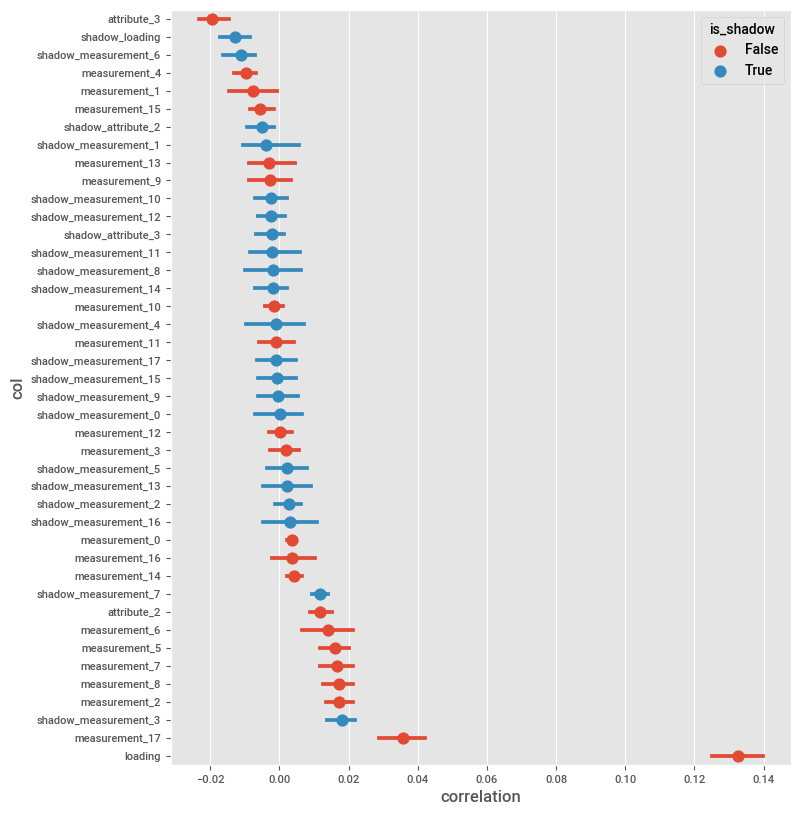

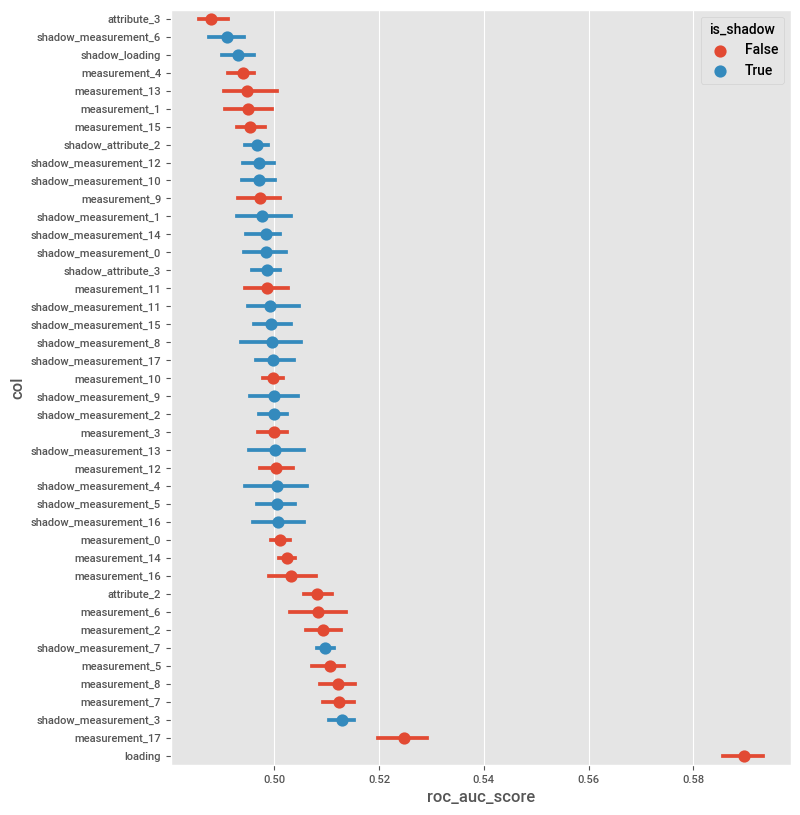

In [11]:
# Set plotting style for rest of notebook
plt.style.use("ggplot")


metric = "roc_auc_score"
for metric in met_funcs:
    met_name = metric.__name__
    fig, ax = plt.subplots(figsize=(8, 10))
    # fig, ax = plt.subplots(dpi=200)
    tmp = res[res.metric == met_name].copy()
    tmp["is_shadow"] = tmp["col"].str.contains("shadow")
    order = tmp.groupby("col")["score"].mean().sort_values()
    sns.pointplot(data=tmp, x="score", y="col", ax=ax, order=order.index, join=False, hue="is_shadow")
    ax.set_xlabel(met_name)
    plt.show()

#### Process Number 2 - Target Shuffling

Motivated by the famous John Elder: <https://www.elderresearch.com/resource/innovations/target-shuffling-process/>

Algorithm:

1. Shuffle every feature many times (e.g., 100 or 1000)
2. Compare the correlation and AUC of the real feature to the many copies
3. Calculate the pseudo-p-value, representing likelihood we'd see this big of a relationship if it was from chance alone.

For speed, we will shuffle the entire dataset all at once.

In [15]:
num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
rng = np.random.default_rng(5)
n = 100

met_funcs = [correlation, roc_auc_score]
train_num = train[num_cols].copy()
row_list = []
for i in range(n + 1):
    if i == 0:
        tmp = train_num.copy()
    else:
        tmp = train_num.sample(frac=1.0, replace=False, random_state=i)
    tmp["failure"] = train["failure"].to_numpy()
    for col in num_cols:
        mask = tmp[col].notna()
        for met in met_funcs:
            val = met(tmp.loc[mask, "failure"], tmp.loc[mask, col])
            row = {
                "metric": met.__name__,
                "score": val,
                "rs": i,
                "col": col,
            }
            row_list.append(row)
res = pd.DataFrame(row_list)
res



,metric,score,rs,col
0,correlation,0.129089,0,loading
1,roc_auc_score,0.587946,0,loading
2,correlation,0.006337,0,attribute_2
3,roc_auc_score,0.504359,0,attribute_2
4,correlation,-0.019222,0,attribute_3
...,...,...,...,...
4237,roc_auc_score,0.496235,100,measurement_15
4238,correlation,-0.002397,100,measurement_16
4239,roc_auc_score,0.499209,100,measurement_16
4240,correlation,0.004060,100,measurement_17


In [17]:
# P-values
res_ = res.copy()
roc_mask = res_.metric == "roc_auc_score"
res_.loc[roc_mask, "score"] = res_.loc[roc_mask, "score"] - 0.5
g = res_.groupby(["col", "metric"]).apply(lambda df: (df.loc[df.rs == 0, "score"].abs().iloc[0] > df.loc[df.rs > 0, "score"].abs()).mean())
g


col             metric       
attribute_2     correlation      0.69
                roc_auc_score    0.73
attribute_3     correlation      1.00
                roc_auc_score    1.00
loading         correlation      1.00
                roc_auc_score    1.00
measurement_0   correlation      0.94
                roc_auc_score    0.80
measurement_1   correlation      0.91
                roc_auc_score    0.92
measurement_10  correlation      0.19
                roc_auc_score    0.00
measurement_11  correlation      0.49
                roc_auc_score    0.51
measurement_12  correlation      0.43
                roc_auc_score    0.48
measurement_13  correlation      0.30
                roc_auc_score    0.57
measurement_14  correlation      0.74
                roc_auc_score    0.68
measurement_15  correlation      0.41
                roc_auc_score    0.43
measurement_16  correlation      0.28
                roc_auc_score    0.30
measurement_17  correlation      1.00
                roc_

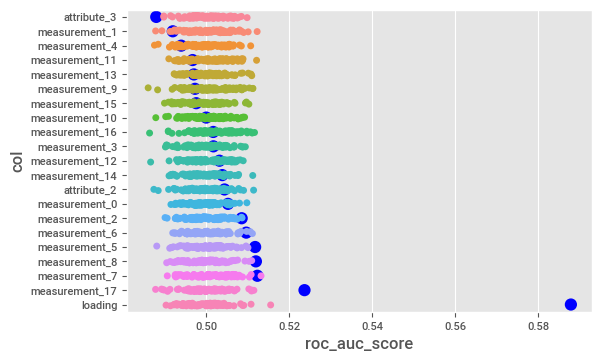

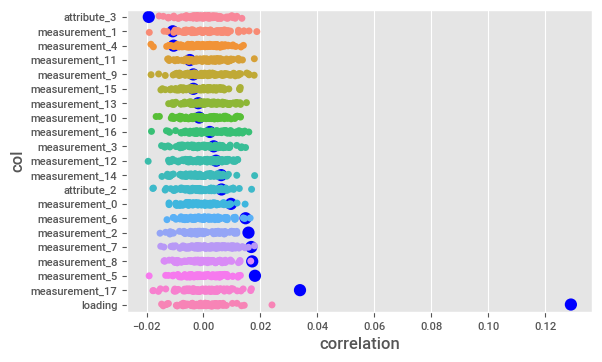

In [32]:

for metric in ["roc_auc_score", "correlation"]:
    fig, ax = plt.subplots()
    order = res.loc[(res.rs == 0) & (res.metric == metric)].sort_values("score")["col"]
    sns.pointplot(data=res[(res.rs == 0) & (res.metric == metric)], x="score", y="col", order=order, join=False, color="blue")
    sns.stripplot(data=res[(res.rs > 0) & (res.metric == metric)], x="score", y="col", order=order)
    ax.set_xlabel(metric)
    plt.show()


Takeaways from this investigation:

* `measurement_17` looks better than random
* `attribute_3` looks slightly better than random, and this is probably a categorical feature, and we didn't even account for that!
* measurements 2, 5, 7, 8 are borderline

We want at least `loading`, `measurement_17`, and probably `attribute_3` in our model.

#### Loading Missingness

There is some indication in the data that the dataset is different when `loading` is missing, most definitively shown in the plot below with `attribute_3`. I will repeat the above feature selection analysis when loading is missing to make sure there's nothing we're missing.



<AxesSubplot:xlabel='failure', ylabel='product_code'>

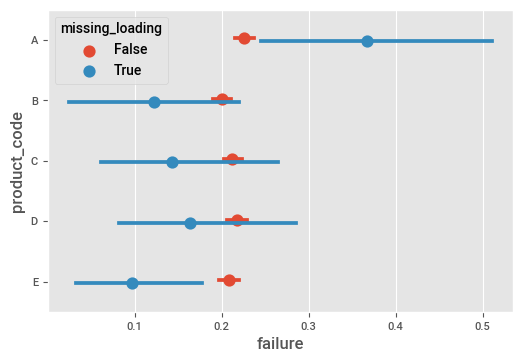

In [33]:
train["missing_loading"] = train.loading.isna().astype("category")
sns.pointplot(data=train, x="failure", y="product_code", hue = "missing_loading", dodge=True, join=False)

In [75]:
n = 100
num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]

met_funcs = [correlation, roc_auc_score]
train_num = train.loc[train.loading.isna(), num_cols].copy()

# Test attribute combinations
train_num["2_plus_3"] = train_num.attribute_2 + train_num.attribute_3
train_num["2_times_3"] = train_num.attribute_2 * train_num.attribute_3
train_num["2_over_3"] = train_num.attribute_2 / train_num.attribute_3
train_num["2_minus_3"] = train_num.attribute_2 - train_num.attribute_3
num_cols = [col for col in train_num.select_dtypes(np.number).columns if col not in ["id", "failure"]]


row_list = []
for i in range(n + 1):
    if i == 0:
        tmp = train_num.copy()
    else:
        tmp = train_num.sample(frac=1.0, replace=False, random_state=i)
    tmp["failure"] = train.loc[train.loading.isna(), "failure"].to_numpy()
    for col in num_cols:
        mask = tmp[col].notna()
        if mask.sum() == 0:
            continue
        for met in met_funcs:
            val = met(tmp.loc[mask, "failure"], tmp.loc[mask, col])
            row = {
                "metric": met.__name__,
                "score": val,
                "rs": i,
                "col": col,
            }
            row_list.append(row)
    if i == 0:
        train_num_saved = tmp.copy()
res = pd.DataFrame(row_list)
res



,metric,score,rs,col
0,correlation,0.183629,0,attribute_2
1,roc_auc_score,0.620918,0,attribute_2
2,correlation,-0.222120,0,attribute_3
3,roc_auc_score,0.341019,0,attribute_3
4,correlation,0.115373,0,measurement_0
...,...,...,...,...
4843,roc_auc_score,0.565755,100,2_times_3
4844,correlation,-0.000895,100,2_over_3
4845,roc_auc_score,0.512798,100,2_over_3
4846,correlation,-0.011606,100,2_minus_3


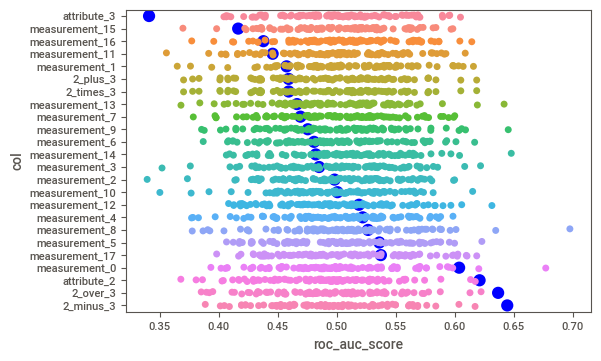

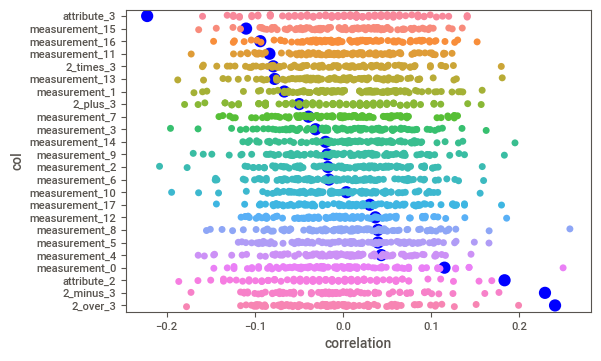

In [72]:

for metric in ["roc_auc_score", "correlation"]:
    fig, ax = plt.subplots()
    order = res.loc[(res.rs == 0) & (res.metric == metric)].sort_values("score")["col"]
    sns.pointplot(data=res[(res.rs == 0) & (res.metric == metric)], x="score", y="col", order=order, join=False, color="blue")
    sns.stripplot(data=res[(res.rs > 0) & (res.metric == metric)], x="score", y="col", order=order)
    ax.set_xlabel(metric)
    plt.show()


Both attributes 2 and 3 have a key relationship when loading is missing. This indicates having a "backup" model might be helpful.

We can use sweetviz to see if the relationship holds across all attributes, and when we treat them as categorical.

Done! Use 'show' commands to display/save.   |██████████| [100%]   00:04 -> (00:00 left)



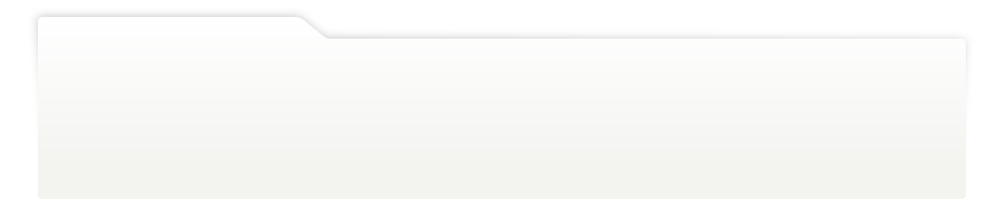
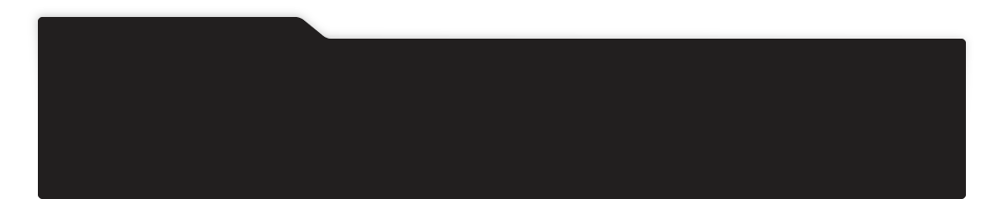
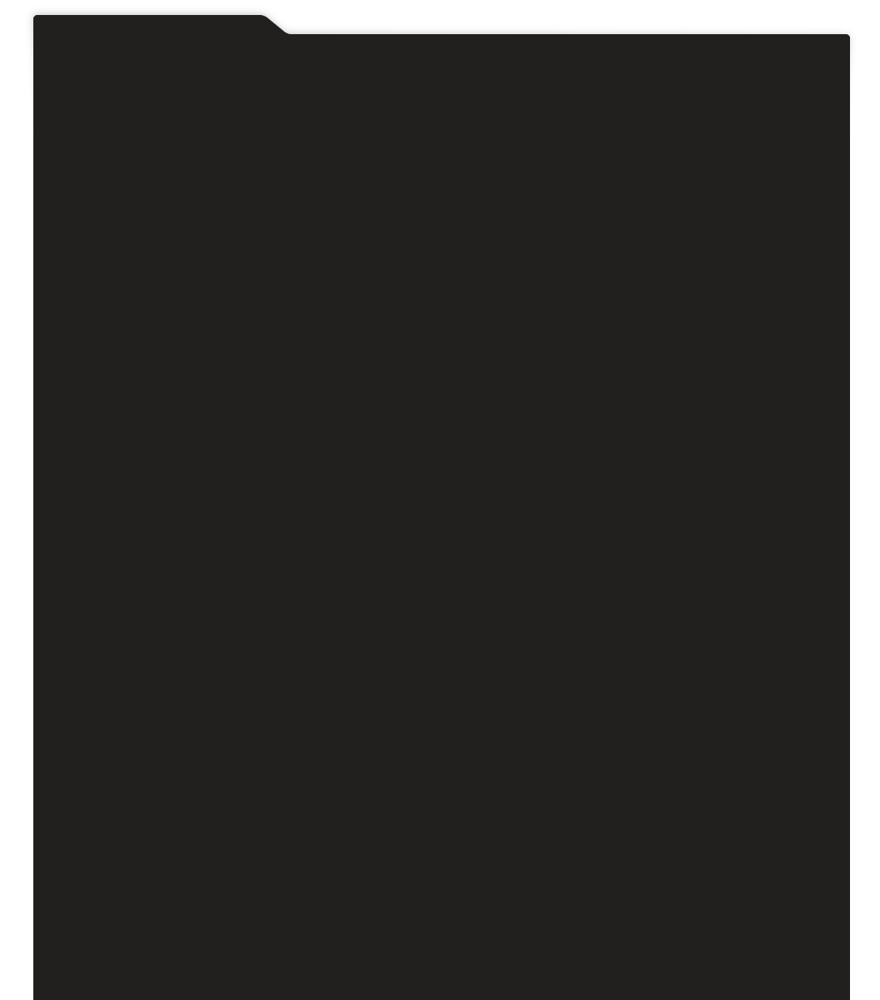
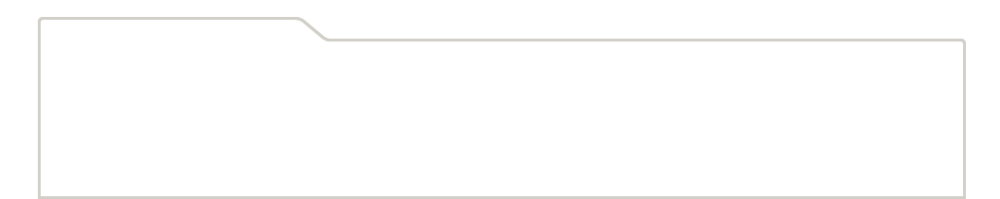
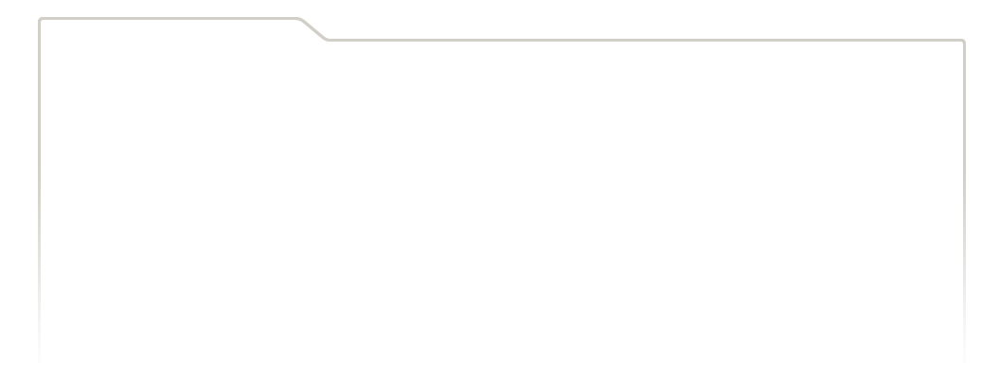
...
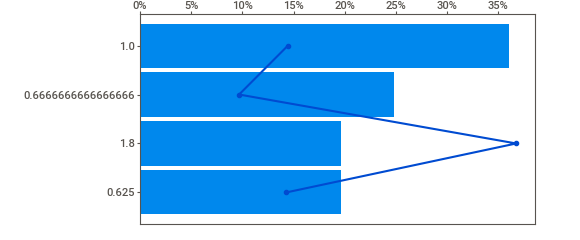
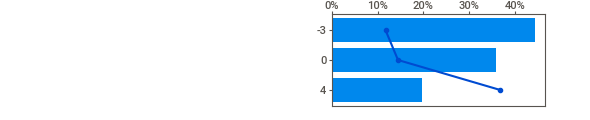
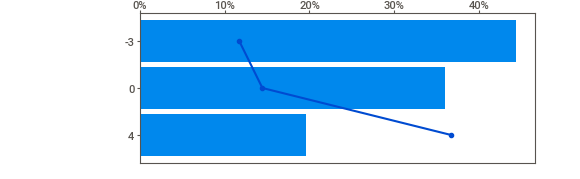
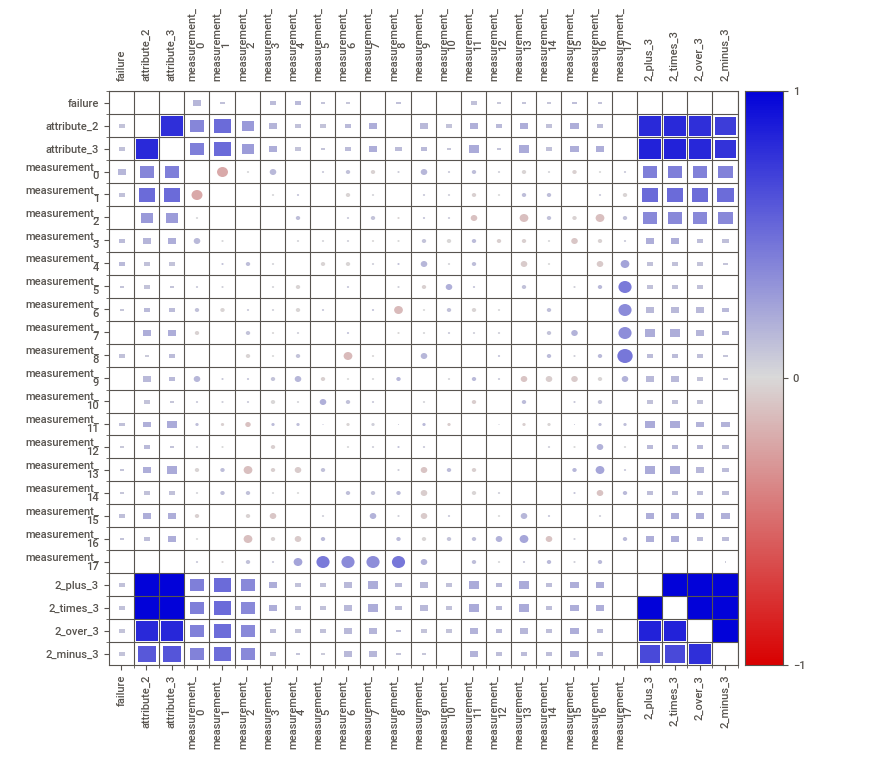
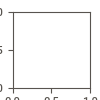

In [77]:

train_report = sv.analyze(train_num_saved, target_feat="failure")#, feat_cfg=sv.FeatureConfig(force_num=["attribute_2", "attribute_3"]))
train_report.show_notebook()

This is actually a challenging issue. The products clearly have different failure behaviors when loading is missing, but to extrapolate that behavior to new products, we have to connect it to one or more of the product attributes. Since product A is the most different from the other four under these conditions, attributes that have the same value for A and any other product code are not likely to be helpful, eliminating attributes 0 and 1.

But both attributes 2 and 3 have a unique value for product A, and in both cases it's either the smallest or largest value. Which of these is driving the behavior? Or is it both? And are these attributes intended to be categorical or ordinal?

My hunch is that:

1. `attribute_3` is the primary driver
2. The relatioship is roughly linear, so the attributes are ordinal

Both of these are based on the increasing failure rates as `attribute_3` gets smaller. `attribute_2` does not have this behavior, but is roughly constant when below 9. The transformations of the two features aren't sufficiently better than `attribute_3` to justify the added complexity.


### Missingness

The missingness patterns are strange/artificial...there's an linearly-increasing percentage of missing values as the measurement numbers get higher.

`meaurement_17` has the highest percent missing, which is a problem given it's the second most valuable feature. This is where having features that predict `measurement_17` well will be helpful.

<AxesSubplot:>

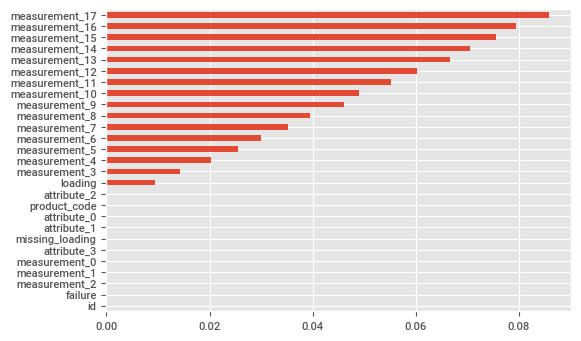

In [39]:
missing = train.isna()
missing.mean().sort_values().plot.barh()

## Modeling

Previous analysis has shown that linear models tend to do better on this problem than tree-based, probably because the dataset is linearly created. Our primary goal for modeling is to build a linear model with some clever imputation:

* Iteratively impute missing values using `product_code` along with the other numeric features (this is mainly for `measurement_17`s sake, but can test applying to all features)
* Use a logistic regression on the imputed values
* Also use `product_code` for explicit CV


This is kind of like doing `cross_val_score` with `IterativeImputer`, but I'm going to code it myself for two reasons:

1. `IterativeImputer` doesn't allow categorical features, so we'd have to leave out `product_code`. We've already demonstrated `product_code` provides valuable information on `measurement_17`, so that's a problem.
2. `cross_val_score` only uses the training data. For iterative imputation, we can actually use the testing predictors to help with the imputation. And we'll need to to submit, since the test data contains new `product_code`s.

We'll also want the ability to use a "backup" model, especially with attributes as features.

### Creating Custom Classifier Class

We can start by creating a scikit-learn classifier object to use for train and testing.

Key Features of `IterativeGroupClassifier`:

1. It uses `X_test` during training, for imputation.
2. It allows for two ways of using `product_code`:
      1. Can be used directly in a model (will be tested using `lightgbm`)
      2. Or it can be used as a grouping variable, and separate models will be fit on each grouping.
3. It allows a "backup" model when the most important feature in the primary model is missing. This is potentially helpful on this problem since `loading` is so valuable but also occassionally missing 


In [113]:
class IterativeGroupClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, iterative_regressor, classifier, backup_est=None, use_backup="partial"):
        self.iterative_regressor = iterative_regressor
        self.classifier = classifier
        if backup_est is None:
            self.backup_est = clone(classifier)
        else:
            self.backup_est = backup_est
        self.use_backup = use_backup

    def _iterative_impute(
        self,
        X: pd.DataFrame,
        group_col: str = None,
        fit: bool = True,
        max_iter: int = 5,
        impute_cols: list[str] = None,
    ):
        """_summary_

        Parameters
        ----------
        X : pd.DataFrame
            _description_
        group_col : str, optional
            If specified, separate imputing models fit to each group, by default None
        fit : bool, optional
            _description_, by default True
        max_iter : int, optional
            _description_, by default 5
        impute_cols : list[str], optional
            If specified, will only impute these columns, by default None

        Returns
        -------
        _type_
            _description_
        """
        # Specify impute cols
        self.impute_cols = impute_cols
        if self.impute_cols is None:
            self.impute_cols = list(X.columns)

        # Perform initial imputations using mean
        complete = X.copy()
        masks = np.zeros(X.shape, dtype=bool)
        for i in range(X.shape[1]):
            masks[:, i] = X.iloc[:, i].notna()
            if ((~masks[:, i]).sum() == 0) | (
                X.columns[i] not in self.impute_cols
            ):
                continue
            complete.iloc[~masks[:, i], i] = X.iloc[masks[:, i], i].mean()
            # complete.iloc[~masks[:, i], i] = X.iloc[masks[:, i], i].median()

        # Iteratively train models
        if fit:
            # Very cool: <https://stackoverflow.com/a/27809959>
            self.models = defaultdict(lambda: defaultdict(dict))
        for i in range(max_iter):
            for j in range(X.shape[1]):
                col = X.columns[j]
                if ((~masks[:, j]).sum() == 0) | (col not in self.impute_cols):
                    continue

                if group_col is None:

                    # Masks for fitting and imputing
                    fit_mask = masks[:, j]
                    pred_mask = ~masks[:, j]
                    if (fit_mask.sum() == 0) | (pred_mask.sum() == 0):
                        # Skip if nothing to fit or predict
                        continue
                    # Fit model
                    curr_pred = [
                        feat for feat in complete.columns if feat not in [col]
                    ]
                    if fit:
                        est = clone(self.iterative_regressor)
                        est.fit(
                            complete.loc[fit_mask, curr_pred],
                            complete.loc[fit_mask, col],
                        )
                        # Save model
                        self.models[i][col] = est

                    # Re-impute missing
                    complete.loc[pred_mask, col] = self.models[i][col].predict(
                        complete.loc[pred_mask, curr_pred]
                    )
                else:
                    for group in complete[group_col].unique():
                        # Masks for fitting and imputing
                        fit_mask = masks[:, j] & (complete[group_col] == group)
                        pred_mask = (~masks[:, j]) & (
                            complete[group_col] == group
                        )

                        if (fit_mask.sum() == 0) | (pred_mask.sum() == 0):
                            # Skip if nothing to fit or predict
                            continue

                        # Fit model
                        curr_pred = [
                            feat
                            for feat in complete.columns
                            if feat not in [col, group_col]
                        ]
                        if fit:
                            est = clone(self.iterative_regressor)
                            est.fit(
                                complete.loc[fit_mask, curr_pred],
                                complete.loc[fit_mask, col],
                            )
                            # Save model
                            self.models[i][col][group] = est

                        # Re-impute missing
                        complete.loc[pred_mask, col] = self.models[i][col][
                            group
                        ].predict(complete.loc[pred_mask, curr_pred])

        return complete

    def _quick_predict(self, est, data):
        if hasattr(est, "predict_proba"):
            return est.predict_proba(data)[:, 1]
        else:
            return est.predict(data)

    def fit(
        self,
        X_train,
        y_train,
        X_test,
        return_predictions=True,
        group_col="product_code",
        use_groups=True,
        fs_func=f_classif,
        **impute_params
    ):
        # Combine X datasets
        train_missing = X_train.isna()
        test_missing = X_test.isna()
        n_train = X_train.shape[0]  # For splitting out later
        X = pd.concat([X_train, X_test])

        # Impute
        if use_groups:
            iterative_group_col = group_col
        else:
            iterative_group_col = None
        complete = self._iterative_impute(
            X,
            group_col=iterative_group_col,
            fit=True,
            **impute_params
        )

        # Re-split
        X_train = complete.iloc[:n_train, :]
        X_test = complete.iloc[n_train:, :]

        # Fit model
        if self.use_backup == "None":
            self.classifier.fit(X_train.drop(columns=group_col), y_train)
        else:
            # Get best col
            f_stat, pvals = fs_func(X_train.drop(columns=group_col), y_train)
            self.backup_col = X_train.columns[f_stat.argmax()]

            mask = train_missing[self.backup_col]

            # Fit primary
            self.classifier.fit(
                X_train[~mask].drop(columns=group_col), y_train[~mask]
            )

            # Fit backup
            self.backup_est.fit(
                X_train[mask].drop(columns=[group_col, self.backup_col]),
                y_train[mask],
            )

        # Get predictions if specified
        if return_predictions:
            if self.use_backup == "None":
                # return self.classifier.predict_proba(
                #     X_test.drop(columns=group_col)
                # )
                return self._quick_predict(self.classifier, X_test.drop(columns=group_col))
            else:
                y_pred = np.zeros(X_test.shape[0])
                mask = test_missing[self.backup_col]

                # Make primary predictions
                # y_pred[~mask, :] = self.classifier.predict_proba(
                #     X_test[~mask].drop(columns=group_col)
                # )
                y_pred[~mask] = self._quick_predict(self.classifier,
                    X_test[~mask].drop(columns=group_col)
                )

                # Make backup predictions
                # y_pred[mask, :] = self.backup_est.predict_proba(
                #     X_test[mask].drop(columns=[group_col, self.backup_col])
                # )
                y_pred[mask] = self._quick_predict(self.backup_est,
                    X_test[mask].drop(columns=[group_col, self.backup_col])
                )
                if self.use_backup == "partial":
                    # Add in primary predictions
                    y_pred[mask] += self._quick_predict(self.classifier,
                        X_test[mask].drop(columns=group_col)
                    )
                    # y_pred[mask, :] += self.classifier.predict_proba(
                    #     X_test[mask].drop(columns=group_col)
                    # )

                    # Divide by 2
                    y_pred[mask] /= 2
                return y_pred
        else:
            return self.classifier

    def predict(self, X_test, group_col="product_code"):
        # Impute
        test_missing = X_test.isna()
        X_test = self._iterative_impute(X_test, group_col=group_col, fit=False)

        # Predict
        if self.backup_est is None:
            return self.classifier.predict_proba(
                X_test.drop(columns=group_col)
            )
        else:
            y_pred = np.zeros((X_test.shape[0], 2))
            mask = test_missing[self.backup_col]

            # Make primary predictions
            y_pred[~mask, :] = self.classifier.predict_proba(
                X_test[~mask].drop(columns=group_col)
            )

            # Make backup predictions
            y_pred[mask, :] = self.backup_est.predict_proba(
                X_test[mask].drop(columns=[group_col, self.backup_col])
            )
            if self.use_backup == "partial":
                # Add in primary predictions
                y_pred[mask, :] += self.classifier.predict_proba(
                    X_test[mask].drop(columns=group_col)
                )

                # Divide by 2
                y_pred[mask, :] /= 2
            return y_pred


### Run CV

The cross validation process needs access to the test dataset, so we have to write our own function.


In [121]:
# Define feature selection function
def fs_func(X, y):
    X_ = SimpleImputer().fit_transform(X)
    return f_classif(X_, y)

def cv_eval(est, X, y, group_col, metrics, test_groups=1, **fit_params):
    """Custom Cross validation

    Parameters
    ----------
    est : _type_
        _description_
    X : _type_
        _description_
    y : _type_
        _description_
    group_col : _type_
        _description_
    metrics : _type_
        _description_
    test_groups : int, optional
        How many product_codes to have in the test fold at a time, by default 1
    use_groups : bool, optional
        _description_, by default True

    Returns
    -------
    _type_
        _description_
    """
    
    # Copy and scale
    ss = StandardScaler()
    X_ = X.copy()
    num_cols = X_.select_dtypes(np.number).columns
    # X_[num_cols] = ss.fit_transform(X[num_cols])

    # Run tests
    row_list = []
    estimators = []
    all_group_sets = combinations(X_[group_col].unique(), test_groups)
    for group_set in all_group_sets:
        row = {"group": group_set}

        # Get train and test groups
        test_mask = X_[group_col].isin(group_set)
        X_train, X_test = X_[~test_mask].copy(), X_[test_mask].copy()
        y_train, y_test = y[~test_mask].copy(), y[test_mask].copy()

        # Train and make predictions
        curr_est = clone(est)
        y_pred = curr_est.fit(
            X_train, y_train, X_test, return_predictions=True, group_col=group_col, **fit_params
        )#[:, 1]

        # Evaluate
        for met in metrics:
            val = met(y_test, y_pred)
            row[met.__name__] = val
        row_list.append(row)
        estimators.append(curr_est)

    return estimators, pd.DataFrame(row_list)


### Run CV Test

A couple things I know from prior testing/eda:

* Small subsets of features (~3) perform much better than large subsets in the classifier model
* Linear models are better than tree-based

The first test is running the basic classifier through an explicit CV process on `product_code`, which should give a good idea of the AUC values we can expect on new data.

I want most of the feature selection to be done within the cross validation loop, to minimize the likelihood of bias in the results. But since several features seem very likely to be noise, I will filter them before beginning.



In [152]:


num_cols = [col for col in train.select_dtypes(np.number).columns if col not in ["id", "failure"]]
pred_cols = [col for col in num_cols if col not in ["id", "failure"]]


train_ = train.copy()
train_.product_code = train_.product_code.astype("category")



# Define iterative regressor
regressor = Pipeline([("si", SimpleImputer()), ("clf", Ridge())])

# Define classifier(s)
clf_primary = Pipeline(
    [
        ("si", SimpleImputer(strategy="median")),
        ("fs", SelectKBest(k=2)),
        # ("lr", LogisticRegression(max_iter=400)),
        ("lr", Ridge(alpha=1)),
    ]
)
clf_backup = Pipeline(
    [
        ("si", SimpleImputer(strategy="mean")),
        ("fs", SelectKBest(k=1)),
        # ("lr", LogisticRegression(max_iter=400)),
        ("lr", Ridge(alpha=1)),
    ]
)
est = IterativeGroupClassifier(
    regressor, clf_primary, backup_est=clf_backup, use_backup="partial"
)

# Use a feature subset
curr_pred = [
    "loading",
    "attribute_3",
    "measurement_17",
] + [f"measurement_{i}" for i in range(3, 10)]

estimators, res = cv_eval(
    est,
    train_[curr_pred + ["product_code"]],
    train_["failure"],
    group_col="product_code",
    metrics=[roc_auc_score],
    test_groups=1,
    use_groups=True,
    impute_cols=["measurement_17"],
    fs_func=fs_func,

)

print(res.roc_auc_score.mean())
res


0.5903200541207647


,group,roc_auc_score
0,"(A,)",0.591167
1,"(B,)",0.590606
2,"(C,)",0.588250
3,"(D,)",0.597089
4,"(E,)",0.584490


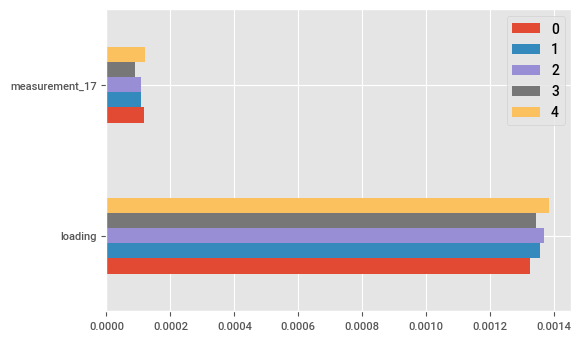

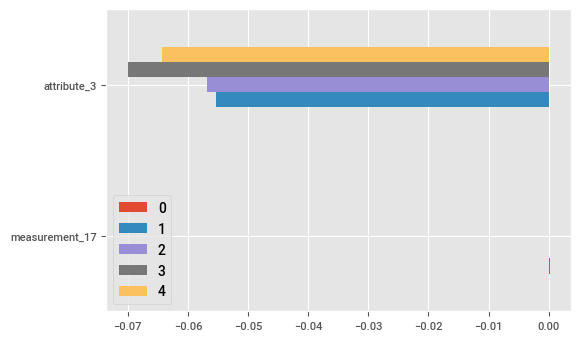

In [153]:
def retrieve_importances(estimator, features):
    # Get chosen feature names
    backup_cols = [col for col in features if col != estimator.backup_col]
    name_idx = estimator.classifier["fs"].get_feature_names_out()
    prim_names = [features[int(ni[1:])] for ni in name_idx]
    bu_name_idx = estimator.backup_est["fs"].get_feature_names_out()
    backup_names = [backup_cols[int(ni[1:])] for ni in bu_name_idx]

    # Get feature importances
    coefs = estimator.classifier["lr"].coef_
    if len(coefs.shape) > 1:
        coefs = coefs[0]
    prim_fi = pd.Series(coefs, index=prim_names)
    coefs = estimator.backup_est["lr"].coef_
    if len(coefs.shape) > 1:
        coefs = coefs[0]
    backup_fi = pd.Series(coefs, index=backup_names)
    backup_fi = pd.Series(estimator.backup_est["lr"].coef_[0], index=backup_names)

    return prim_fi, backup_fi


# Primary features
idx = 0
prim_cols = list(curr_pred)
prim_list, bu_list = [], []
for idx in range(5):
    prim_fi, backup_fi = retrieve_importances(estimators[idx], curr_pred)
    
    # Save
    prim_list.append(prim_fi)
    bu_list.append(backup_fi)

prim_df = pd.concat(prim_list, axis=1)
bu_df = pd.concat(bu_list, axis=1)

# Plot importances
plt.style.use("ggplot")

prim_df.plot.barh()
plt.show()
bu_df.plot.barh()
plt.show()


The model performs decently well compared to leaderboard submissions (~0.59 AUC). The primary model consistently uses the two expected features across all subsets. The backup consistently uses `attribute_3` as expected.

## Test Submissions

### Inspecting final model and predictions

What happens when we train on all data?



In [145]:
# Define iterative regressor
regressor = Pipeline([("si", SimpleImputer()), ("clf", Ridge())])

# Define classifier(s)
clf_primary = Pipeline(
    [
        ("si", SimpleImputer(strategy="median")),
        ("fs", SelectKBest(k=2)),
        ("lr", Ridge()),
    ]
)
clf_backup = Pipeline(
    [
        ("si", SimpleImputer(strategy="mean")),
        ("fs", SelectKBest(k=1)),
        ("lr", Ridge()),
    ]
)
est = IterativeGroupClassifier(
    regressor, clf_primary, backup_est=clf_backup
)

# Use a feature subset
curr_pred = [
    "loading",
    "attribute_3",
    "measurement_17",
] + [f"measurement_{i}" for i in range(3, 10)]

y_pred = est.fit(train[curr_pred + ["product_code"]], train["failure"], test[curr_pred + ["product_code"]], return_predictions=True)

# Save preds
test_ = test.copy()
test_["failure"] = y_pred
test_.head()

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
0,26570,F,119.57,material_5,material_6,6,4,6,9,6,...,10.802,15.909,18.070,13.772,13.659,16.825,13.742,17.710,634.612,0.194551
1,26571,F,113.51,material_5,material_6,6,4,11,8,0,...,12.032,13.998,NaN,12.473,17.468,16.708,14.776,14.102,537.037,0.175811
2,26572,F,112.16,material_5,material_6,6,4,8,12,4,...,11.743,17.046,18.086,10.907,13.363,15.737,17.065,16.021,658.995,0.187144
3,26573,F,112.72,material_5,material_6,6,4,8,11,10,...,11.790,18.165,16.163,10.933,15.501,15.667,12.620,16.111,594.301,0.180921
4,26574,F,208.00,material_5,material_6,6,4,14,16,8,...,12.370,14.578,17.849,11.941,16.070,16.183,13.324,17.150,801.044,0.332310


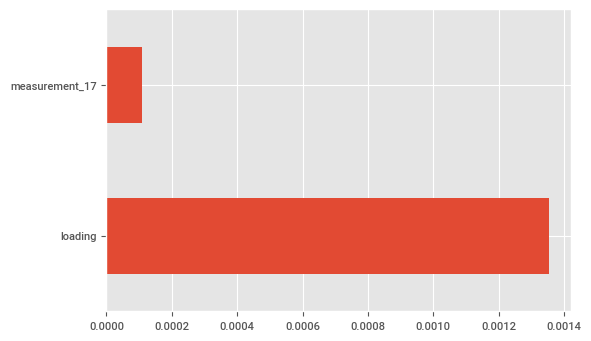

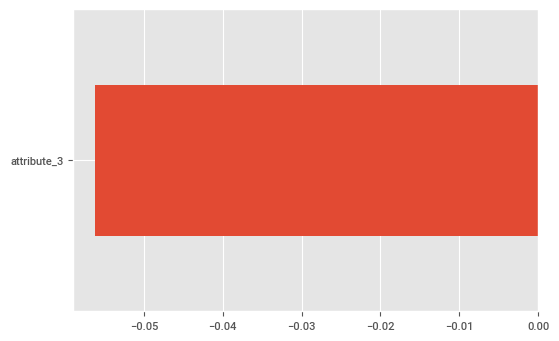

In [146]:
# Get importances
prim_fi, backup_fi = retrieve_importances(est, curr_pred)

# Plot importances
prim_fi.plot.barh()
plt.show()

# Plot backup importances
backup_fi.plot.barh()
plt.show()


In [140]:
test_.failure.describe()

count    20775.000000
mean         0.212896
std          0.054784
min          0.067137
25%          0.173569
50%          0.205807
75%          0.244090
max          0.545081
Name: failure, dtype: float64

### Final Takeaways for the Business

Using a linear regressor for a classification problem is underrated--it often performs just as well as logistic regression from a ranking perspective, and the coefficients have more meaning.

Final Takeaways:

1. 10-unit increase in `loading` roughly leads to a 1.3% increase in `failure` likelihood
2. 100-unit increase in `measurement_17` roughly leads to a 1% increase in `failure` likelihood
3. 1-unit increase in `attribute_3` _when `loading` is missing_ roughly leads to a 5.5% decrease in `failure` likelihood
4. Measurements 3-9 almost perfectly predict `measurement_17`


### Submitting Predictions

In [147]:
test_[["id", "failure"]].to_csv("../data/predictions/final_ridge_pred.csv", index=False)